In [ ]:
import torch
from torch import nn
from dataset import Rice2
from torch.utils.data import DataLoader, random_split
from torch.optim import Adam
from torch.utils.data import Subset
from torch.optim.lr_scheduler import LambdaLR

from utility import plot_losses, to_img, plot_samples_cvae
from losses import vae_loss, weighted_l1_loss, compute_ssim
from models import Autoencoder

import time
import os

from skimage.metrics import peak_signal_noise_ratio as psnr_fn



cuda


# Hyperparameter and Dataloader

In [ ]:

use_masks = True  # True -> mask as 4. inputchannel
cond_channels = 4 if use_masks else 3

model = Autoencoder(latent_dim=128, cond_channels=cond_channels).to(device)

optimizer = Adam(model.parameters(), lr=1e-4, betas=(0.5, 0.999))


num_epochs = 150
batch_size = 8
beta = 0.1                          # beta for the KL loss term
train_losses, val_losses = [], []
train_recon, val_recon = [], []
train_kl, val_kl = [], []
val_psnrs, val_ssims = [], []

# parameters for the weighted L1 loss
# weighted L1 = w_factor * L1 *(1.0 + w_extra * mask)
w_factor = 0.3
w_extra = 5.0

# for early stopping
best_score = -1.0

# learning rate decay: from epoch decay_start to num_epochs, linearly from 1.0 to 0.0
decay_start = num_epochs // 2  

def lr_lambda(epoch):
    if epoch < decay_start:
        return 1.0
    # linearly decay from 1.0 to 0.0
    return max(0.0, 1.0 - (epoch - decay_start) / (num_epochs - decay_start))

# define the learning rate scheduler with the lr_lambda function
scheduler = LambdaLR(optimizer, lr_lambda=lr_lambda)


data_dir = "./RICE2"

# full dataset, no augmentation, to get the total number of samples
base_dataset = Rice2(data_dir, augment=False)
n_total = len(base_dataset)

n_train = int(0.64 * n_total)
n_val = int(0.16 * n_total)
n_test = n_total - n_train - n_val  

# reproducible random split of the dataset into train, val, and test subsets
split_generator = torch.Generator().manual_seed(42)
train_subset, val_subset, test_subset = random_split(
    base_dataset, [n_train, n_val, n_test], generator=split_generator
)
train_idx = train_subset.indices
val_idx = val_subset.indices
test_idx = test_subset.indices

# create the actual datasets with augmentation for training and no augmentation for validation and testing
train_data = Subset(Rice2(data_dir, augment=True), train_idx)
val_data = Subset(Rice2(data_dir, augment=False), val_idx)
test_data = Subset(Rice2(data_dir, augment=False), test_idx)

print(
    f"Gesamt: {n_total} | "
    f"Train: {len(train_data)} ({len(train_data)/n_total:.0%}) | "
    f"Val: {len(val_data)} ({len(val_data)/n_total:.0%}) | "
    f"Test: {len(test_data)} ({len(test_data)/n_total:.0%})"
)

# DataLoader
train_dataloader = DataLoader(
    train_data,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4,          # for faster data loading
    pin_memory=True,        # faster transfer to GPU
    persistent_workers=True,# keep workers alive between epochs for faster loading
)
val_dataloader = DataLoader(
    val_data,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True,
    persistent_workers=True,
)
test_dataloader = DataLoader(
    test_data,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True,
    persistent_workers=True,
)

Gesamt: 736 | Train: 471 (64%) | Val: 117 (16%) | Test: 148 (20%)


### define fixed batch for visualization

In [ ]:
plot_dataset = Rice2(data_dir, augment=False)

# filenames of wished images
wanted_names = ["548.png", "449.png", "282.png", "111.png", "22.png"]

cloudy_list, ground_truth_list, mask_list = [], [], []
for name in wanted_names:
    pos = plot_dataset.ids.index(name)  # find the position of this filename
    c, l, m = plot_dataset[pos]
    cloudy_list.append(c)
    ground_truth_list.append(l)
    mask_list.append(m)

# create a torch tensor batch from the lists of images, ground_truths, and masks
fixed_batch = (
    torch.stack(cloudy_list),
    torch.stack(ground_truth_list),
    torch.stack(mask_list),
)

/data/home/lec42675/.venv/gpu-env/lib/python3.10/site-packages/torchvision/transforms/v2/functional/_deprecated.py:12: UserWarning: The function `to_tensor(...)` is deprecated and will be removed in a future release. Instead, please use `to_image(...)` followed by `to_dtype(..., dtype=torch.float32, scale=True)`.
  warnings.warn(


In [ ]:
# function to create conditional input for the autoencoder
def make_cond(cloudy, mask):
    return torch.cat([cloudy, mask], dim=1) if use_masks else cloudy

# Training 

Epoch [1/150], Train: 0.7145, Val: 0.5471, LR: 1.00e-04, PSNR: 12.43 | SSIM: 0.4478


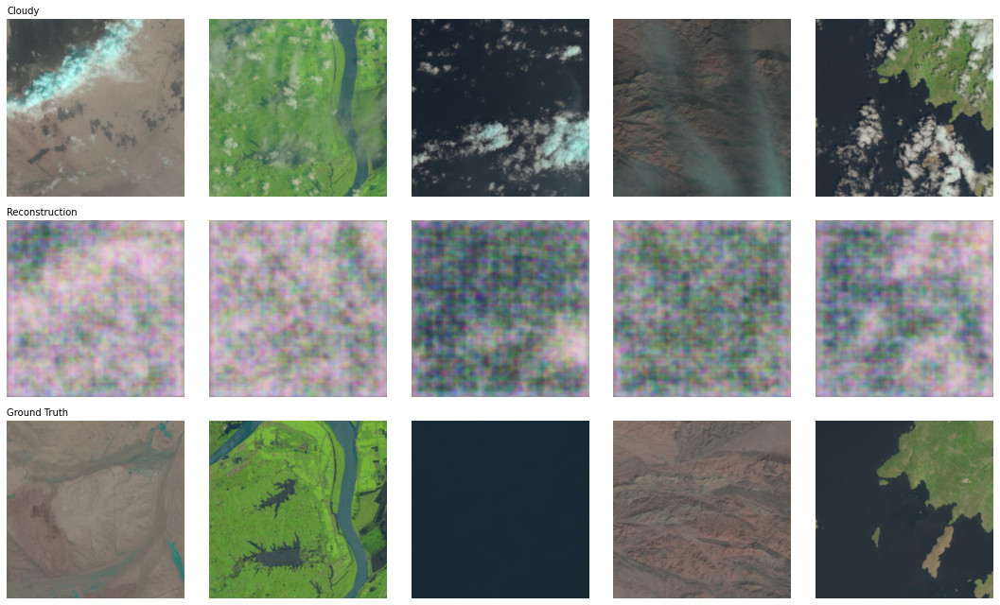

Epoch [2/150], Train: 3.0824, Val: 0.9652, LR: 1.00e-04, PSNR: 16.08 | SSIM: 0.6265
Epoch [3/150], Train: 0.8116, Val: 0.7554, LR: 1.00e-04, PSNR: 16.42 | SSIM: 0.6379
Epoch [4/150], Train: 0.9802, Val: 0.6023, LR: 1.00e-04, PSNR: 18.06 | SSIM: 0.6469
Epoch [5/150], Train: 0.7645, Val: 4.1951, LR: 1.00e-04, PSNR: 19.09 | SSIM: 0.6709
Epoch [6/150], Train: 1.4809, Val: 5.5141, LR: 1.00e-04, PSNR: 17.20 | SSIM: 0.6823
Epoch [7/150], Train: 0.9584, Val: 0.6296, LR: 1.00e-04, PSNR: 17.85 | SSIM: 0.6399
Epoch [8/150], Train: 0.6915, Val: 0.6976, LR: 1.00e-04, PSNR: 18.99 | SSIM: 0.6379
Epoch [9/150], Train: 0.7306, Val: 0.7738, LR: 1.00e-04, PSNR: 19.11 | SSIM: 0.6801
Epoch [10/150], Train: 0.5736, Val: 0.6010, LR: 1.00e-04, PSNR: 19.32 | SSIM: 0.6605
Epoch [11/150], Train: 0.6631, Val: 1.5095, LR: 1.00e-04, PSNR: 20.30 | SSIM: 0.6951


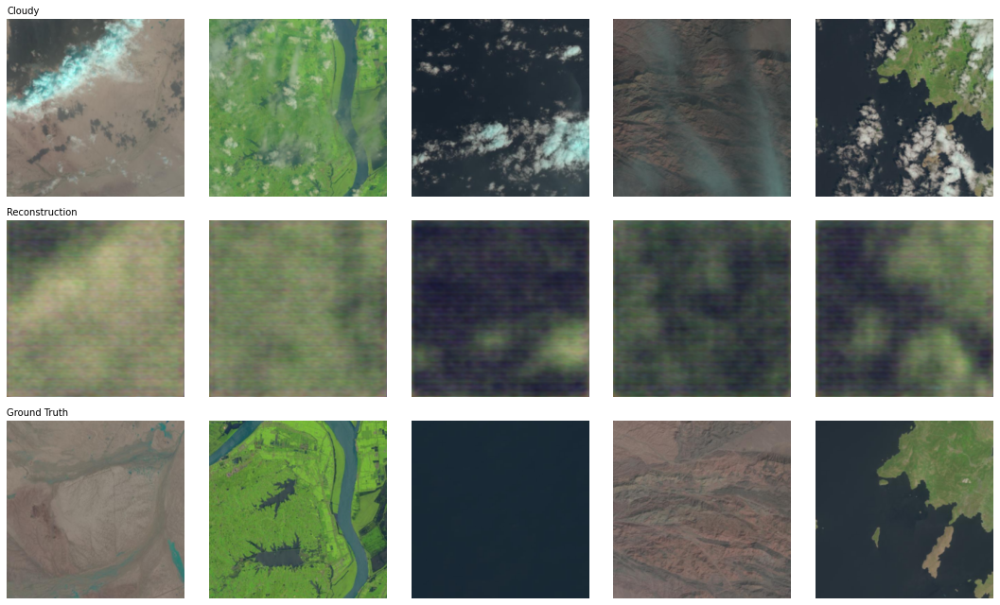

Epoch [12/150], Train: 1.1433, Val: 0.7827, LR: 1.00e-04, PSNR: 18.09 | SSIM: 0.7085
Epoch [13/150], Train: 0.7779, Val: 0.5813, LR: 1.00e-04, PSNR: 19.20 | SSIM: 0.6891
Epoch [14/150], Train: 0.5677, Val: 0.5916, LR: 1.00e-04, PSNR: 19.44 | SSIM: 0.6866
Epoch [15/150], Train: 0.5452, Val: 0.5339, LR: 1.00e-04, PSNR: 19.86 | SSIM: 0.6905
Epoch [16/150], Train: 0.5565, Val: 0.5324, LR: 1.00e-04, PSNR: 20.72 | SSIM: 0.7189
Epoch [17/150], Train: 0.6841, Val: 0.6121, LR: 1.00e-04, PSNR: 20.59 | SSIM: 0.7291
Epoch [18/150], Train: 0.5765, Val: 0.7561, LR: 1.00e-04, PSNR: 20.81 | SSIM: 0.7353
Epoch [19/150], Train: 0.5827, Val: 0.5415, LR: 1.00e-04, PSNR: 20.13 | SSIM: 0.7417
Epoch [20/150], Train: 0.5557, Val: 0.5393, LR: 1.00e-04, PSNR: 20.35 | SSIM: 0.7271
Epoch [21/150], Train: 0.6785, Val: 4.6299, LR: 1.00e-04, PSNR: 18.25 | SSIM: 0.7005


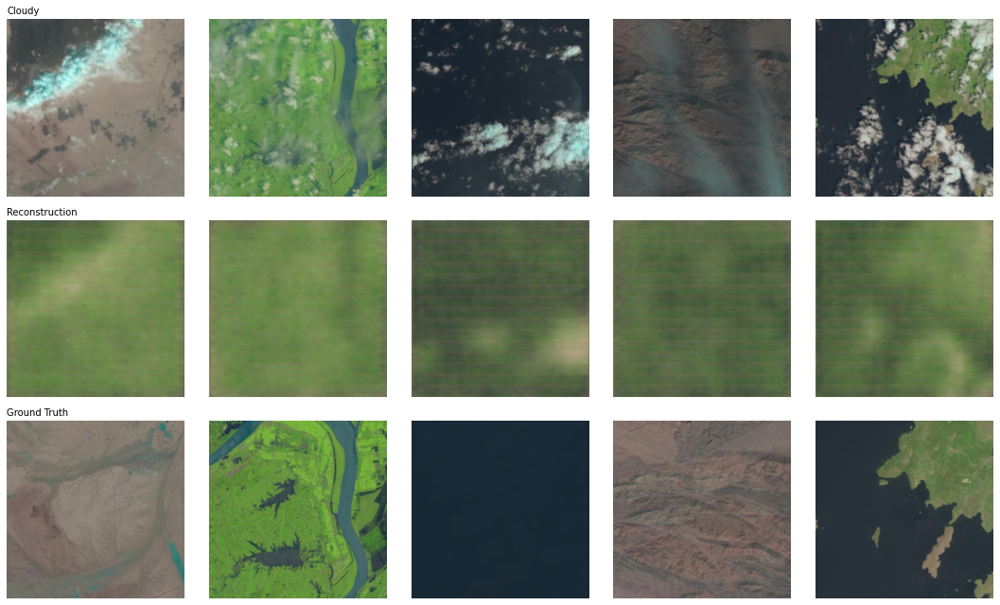

Epoch [22/150], Train: 0.6326, Val: 0.6501, LR: 1.00e-04, PSNR: 17.56 | SSIM: 0.6842
Epoch [23/150], Train: 0.5762, Val: 0.5300, LR: 1.00e-04, PSNR: 17.77 | SSIM: 0.6862
Epoch [24/150], Train: 0.6315, Val: 0.4721, LR: 1.00e-04, PSNR: 20.72 | SSIM: 0.7500
Epoch [25/150], Train: 0.6783, Val: 0.4659, LR: 1.00e-04, PSNR: 20.34 | SSIM: 0.7323
Epoch [26/150], Train: 0.5667, Val: 0.5244, LR: 1.00e-04, PSNR: 21.67 | SSIM: 0.7456
Epoch [27/150], Train: 0.5745, Val: 0.6845, LR: 1.00e-04, PSNR: 21.95 | SSIM: 0.7525
Epoch [28/150], Train: 0.6052, Val: 0.5087, LR: 1.00e-04, PSNR: 19.72 | SSIM: 0.7273
Epoch [29/150], Train: 0.5382, Val: 0.4844, LR: 1.00e-04, PSNR: 21.16 | SSIM: 0.7338
Epoch [30/150], Train: 0.5362, Val: 0.4538, LR: 1.00e-04, PSNR: 21.78 | SSIM: 0.7517
Epoch [31/150], Train: 0.6631, Val: 0.8609, LR: 1.00e-04, PSNR: 20.11 | SSIM: 0.7394


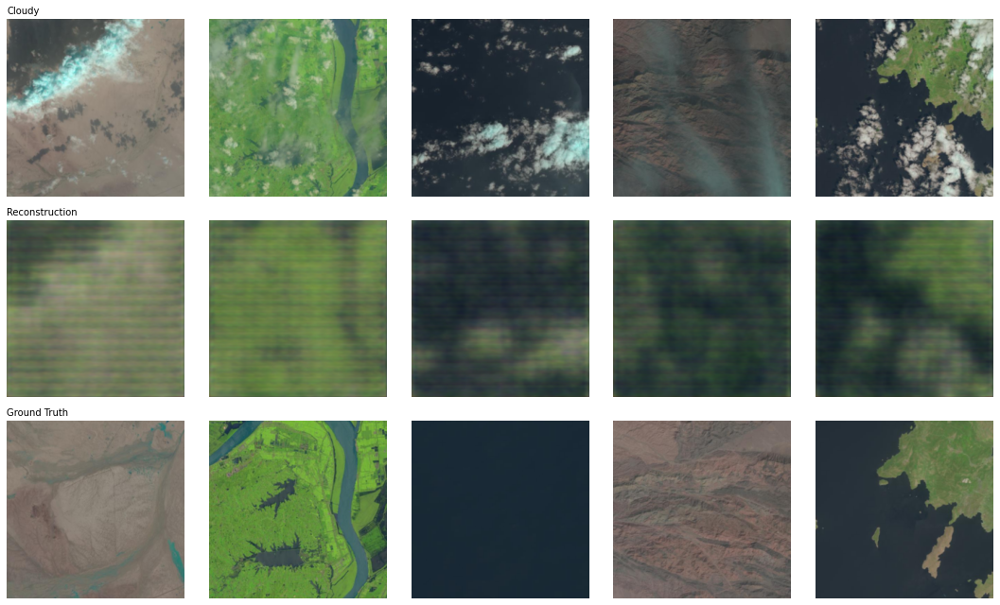

Epoch [32/150], Train: 0.5734, Val: 0.5417, LR: 1.00e-04, PSNR: 21.10 | SSIM: 0.7235
Epoch [33/150], Train: 0.5735, Val: 0.4949, LR: 1.00e-04, PSNR: 21.87 | SSIM: 0.7593
Epoch [34/150], Train: 0.5663, Val: 3.8422, LR: 1.00e-04, PSNR: 20.21 | SSIM: 0.7258
Epoch [35/150], Train: 0.5856, Val: 0.4942, LR: 1.00e-04, PSNR: 20.54 | SSIM: 0.7369
Epoch [36/150], Train: 0.5668, Val: 0.5093, LR: 1.00e-04, PSNR: 21.05 | SSIM: 0.7527
Epoch [37/150], Train: 0.6936, Val: 0.7256, LR: 1.00e-04, PSNR: 17.70 | SSIM: 0.6720
Epoch [38/150], Train: 0.5585, Val: 0.5762, LR: 1.00e-04, PSNR: 21.11 | SSIM: 0.7486
Epoch [39/150], Train: 0.5656, Val: 0.6227, LR: 1.00e-04, PSNR: 20.49 | SSIM: 0.7252
Epoch [40/150], Train: 0.5700, Val: 0.5688, LR: 1.00e-04, PSNR: 21.63 | SSIM: 0.7407
Epoch [41/150], Train: 0.5787, Val: 0.5813, LR: 1.00e-04, PSNR: 21.47 | SSIM: 0.7419


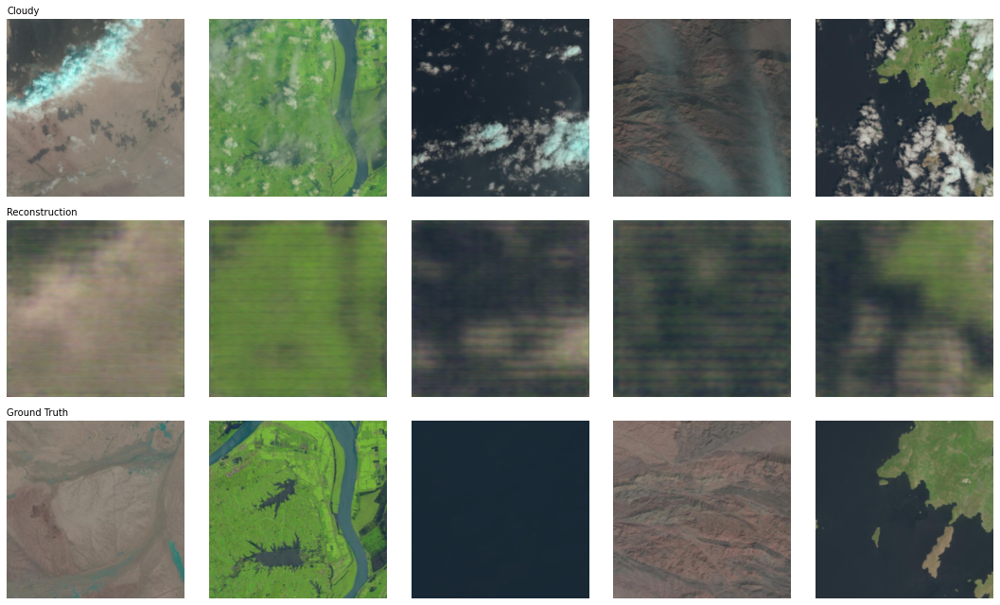

Epoch [42/150], Train: 0.7058, Val: 0.6525, LR: 1.00e-04, PSNR: 20.27 | SSIM: 0.7280
Epoch [43/150], Train: 0.6036, Val: 0.5289, LR: 1.00e-04, PSNR: 21.41 | SSIM: 0.7473
Epoch [44/150], Train: 0.5891, Val: 0.5460, LR: 1.00e-04, PSNR: 20.51 | SSIM: 0.7301
Epoch [45/150], Train: 0.8022, Val: 0.5237, LR: 1.00e-04, PSNR: 21.30 | SSIM: 0.7459
Epoch [46/150], Train: 0.6176, Val: 0.6851, LR: 1.00e-04, PSNR: 21.32 | SSIM: 0.7520
Epoch [47/150], Train: 0.5819, Val: 0.5199, LR: 1.00e-04, PSNR: 21.05 | SSIM: 0.7356
Epoch [48/150], Train: 0.6261, Val: 0.4952, LR: 1.00e-04, PSNR: 20.75 | SSIM: 0.7257
Epoch [49/150], Train: 0.5956, Val: 0.8498, LR: 1.00e-04, PSNR: 20.84 | SSIM: 0.7373
Epoch [50/150], Train: 0.6003, Val: 0.6464, LR: 1.00e-04, PSNR: 22.31 | SSIM: 0.7531
Epoch [51/150], Train: 0.5840, Val: 0.5284, LR: 1.00e-04, PSNR: 21.51 | SSIM: 0.7603


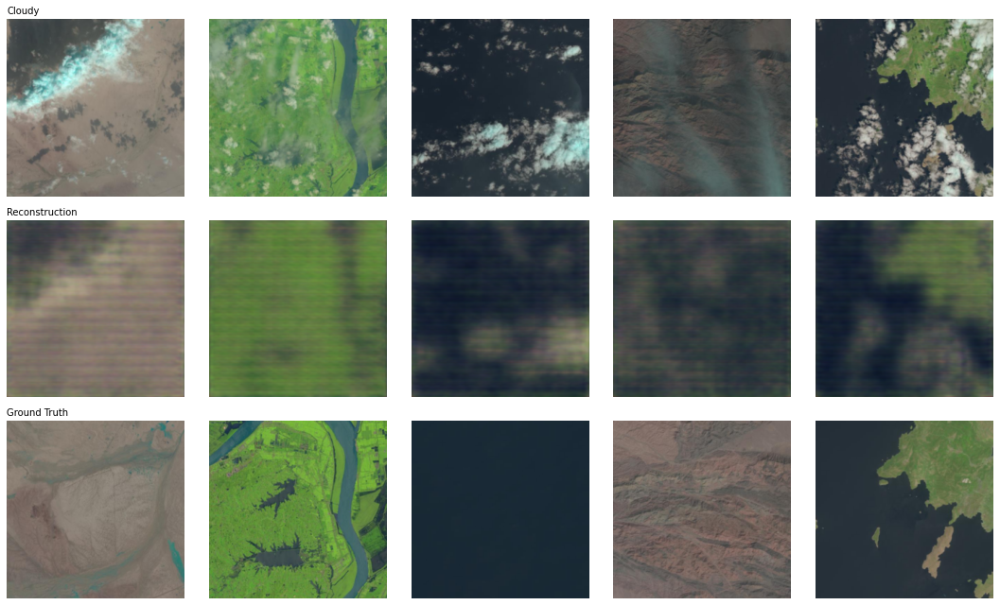

Epoch [52/150], Train: 0.5682, Val: 0.5169, LR: 1.00e-04, PSNR: 21.36 | SSIM: 0.7523
Epoch [53/150], Train: 0.5595, Val: 0.4812, LR: 1.00e-04, PSNR: 21.44 | SSIM: 0.7503
Epoch [54/150], Train: 0.5581, Val: 0.4638, LR: 1.00e-04, PSNR: 22.08 | SSIM: 0.7640
Epoch [55/150], Train: 0.5382, Val: 0.5157, LR: 1.00e-04, PSNR: 22.08 | SSIM: 0.7539
Epoch [56/150], Train: 0.5559, Val: 0.5226, LR: 1.00e-04, PSNR: 21.82 | SSIM: 0.7620
Epoch [57/150], Train: 0.5631, Val: 0.5546, LR: 1.00e-04, PSNR: 22.27 | SSIM: 0.7490
Epoch [58/150], Train: 0.5697, Val: 0.6134, LR: 1.00e-04, PSNR: 21.75 | SSIM: 0.7555
Epoch [59/150], Train: 0.5750, Val: 0.5014, LR: 1.00e-04, PSNR: 21.32 | SSIM: 0.7406
Epoch [60/150], Train: 0.5633, Val: 0.6399, LR: 1.00e-04, PSNR: 21.45 | SSIM: 0.7411
Epoch [61/150], Train: 0.5598, Val: 0.5434, LR: 1.00e-04, PSNR: 21.35 | SSIM: 0.7465


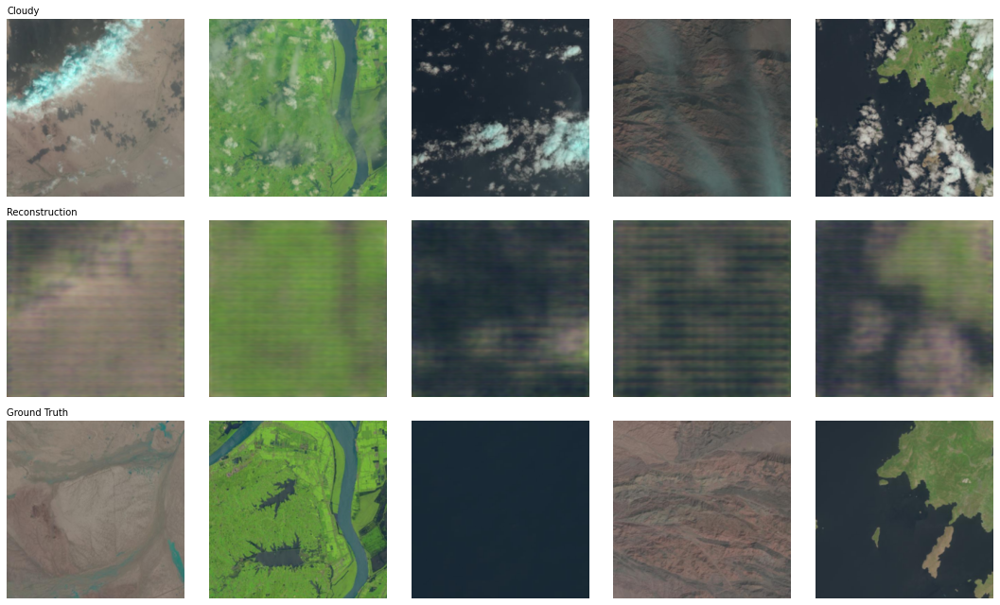

Epoch [62/150], Train: 0.5778, Val: 0.5244, LR: 1.00e-04, PSNR: 21.78 | SSIM: 0.7461
Epoch [63/150], Train: 0.5798, Val: 0.5083, LR: 1.00e-04, PSNR: 21.38 | SSIM: 0.7399
Epoch [64/150], Train: 0.5667, Val: 0.5249, LR: 1.00e-04, PSNR: 21.81 | SSIM: 0.7600
Epoch [65/150], Train: 0.6028, Val: 0.5207, LR: 1.00e-04, PSNR: 21.57 | SSIM: 0.7518
Epoch [66/150], Train: 0.5715, Val: 0.5498, LR: 1.00e-04, PSNR: 21.62 | SSIM: 0.7500
Epoch [67/150], Train: 0.5406, Val: 0.5102, LR: 1.00e-04, PSNR: 21.60 | SSIM: 0.7489
Epoch [68/150], Train: 0.5514, Val: 0.5043, LR: 1.00e-04, PSNR: 21.62 | SSIM: 0.7601
Epoch [69/150], Train: 0.5552, Val: 0.5239, LR: 1.00e-04, PSNR: 21.89 | SSIM: 0.7638
Epoch [70/150], Train: 0.5616, Val: 0.5386, LR: 1.00e-04, PSNR: 21.84 | SSIM: 0.7454
Epoch [71/150], Train: 0.5587, Val: 0.5203, LR: 1.00e-04, PSNR: 21.30 | SSIM: 0.7424


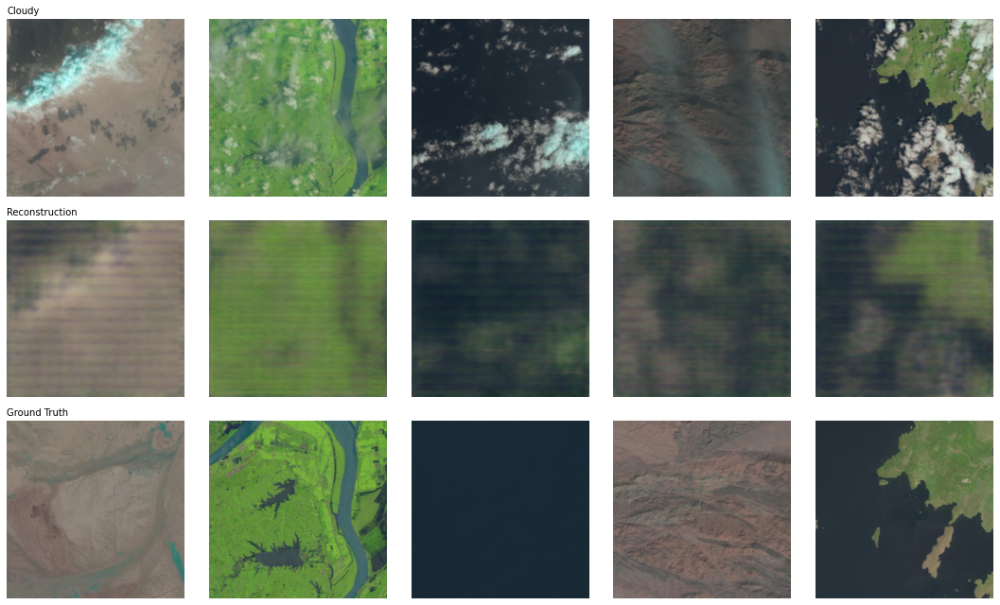

Epoch [72/150], Train: 0.5769, Val: 0.5223, LR: 1.00e-04, PSNR: 22.23 | SSIM: 0.7551
Epoch [73/150], Train: 0.6541, Val: 0.5773, LR: 1.00e-04, PSNR: 20.04 | SSIM: 0.7204
Epoch [74/150], Train: 0.6055, Val: 0.7443, LR: 1.00e-04, PSNR: 21.29 | SSIM: 0.7515
Epoch [75/150], Train: 0.5822, Val: 0.5149, LR: 1.00e-04, PSNR: 21.43 | SSIM: 0.7462
Epoch [76/150], Train: 0.5755, Val: 0.5914, LR: 9.87e-05, PSNR: 21.43 | SSIM: 0.7526
Epoch [77/150], Train: 0.5695, Val: 0.5397, LR: 9.73e-05, PSNR: 22.13 | SSIM: 0.7522
Epoch [78/150], Train: 0.5698, Val: 0.5297, LR: 9.60e-05, PSNR: 22.56 | SSIM: 0.7679
Epoch [79/150], Train: 0.5497, Val: 0.5309, LR: 9.47e-05, PSNR: 22.00 | SSIM: 0.7631
Epoch [80/150], Train: 0.5949, Val: 0.5716, LR: 9.33e-05, PSNR: 20.34 | SSIM: 0.7260
Epoch [81/150], Train: 0.6621, Val: 0.5499, LR: 9.20e-05, PSNR: 20.62 | SSIM: 0.7455


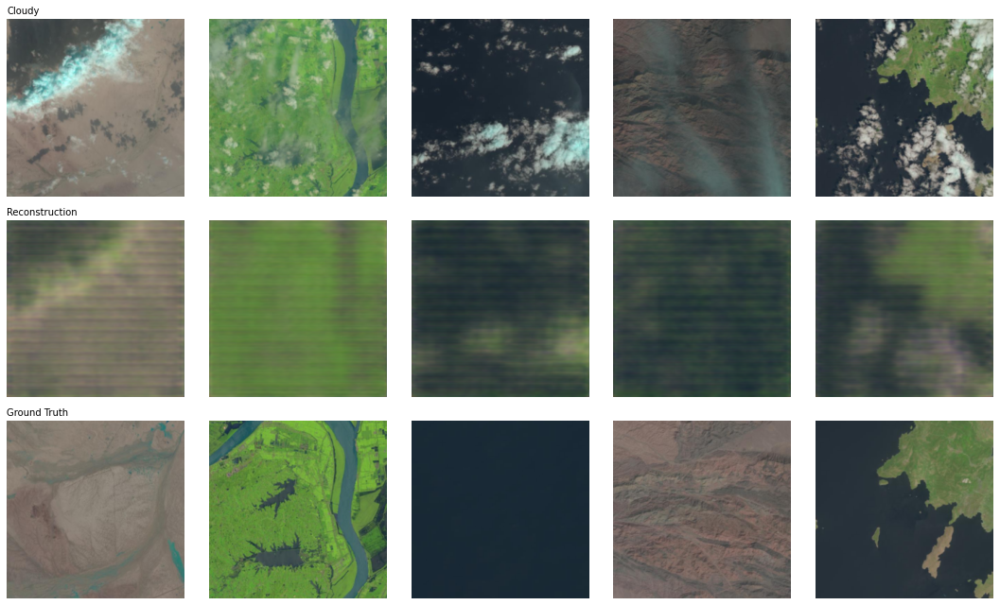

Epoch [82/150], Train: 0.5901, Val: 0.5811, LR: 9.07e-05, PSNR: 22.25 | SSIM: 0.7460
Epoch [83/150], Train: 0.5975, Val: 0.5281, LR: 8.93e-05, PSNR: 21.72 | SSIM: 0.7525
Epoch [84/150], Train: 0.5872, Val: 0.5150, LR: 8.80e-05, PSNR: 22.17 | SSIM: 0.7632
Epoch [85/150], Train: 0.5664, Val: 0.5668, LR: 8.67e-05, PSNR: 22.60 | SSIM: 0.7683
Epoch [86/150], Train: 0.5618, Val: 0.5529, LR: 8.53e-05, PSNR: 22.31 | SSIM: 0.7627
Epoch [87/150], Train: 0.5902, Val: 0.6189, LR: 8.40e-05, PSNR: 22.13 | SSIM: 0.7431
Epoch [88/150], Train: 0.5563, Val: 0.5267, LR: 8.27e-05, PSNR: 22.01 | SSIM: 0.7470
Epoch [89/150], Train: 0.5574, Val: 0.6082, LR: 8.13e-05, PSNR: 21.39 | SSIM: 0.7526
Epoch [90/150], Train: 0.5589, Val: 0.5314, LR: 8.00e-05, PSNR: 21.99 | SSIM: 0.7558
Epoch [91/150], Train: 0.5762, Val: 0.5336, LR: 7.87e-05, PSNR: 20.61 | SSIM: 0.7419


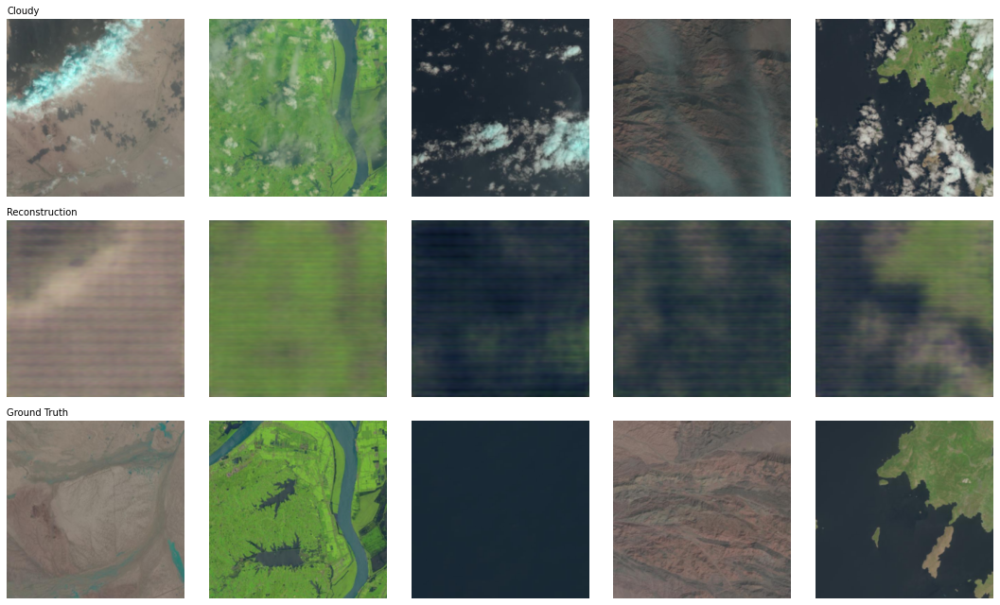

Epoch [92/150], Train: 0.5504, Val: 0.6609, LR: 7.73e-05, PSNR: 20.99 | SSIM: 0.7561
Epoch [93/150], Train: 0.5850, Val: 0.5216, LR: 7.60e-05, PSNR: 23.11 | SSIM: 0.7642
Epoch [94/150], Train: 0.5674, Val: 0.5349, LR: 7.47e-05, PSNR: 22.08 | SSIM: 0.7596
Epoch [95/150], Train: 0.5533, Val: 0.5111, LR: 7.33e-05, PSNR: 22.23 | SSIM: 0.7595
Epoch [96/150], Train: 0.5926, Val: 0.5439, LR: 7.20e-05, PSNR: 20.92 | SSIM: 0.7510
Epoch [97/150], Train: 0.5836, Val: 0.5601, LR: 7.07e-05, PSNR: 21.58 | SSIM: 0.7471
Epoch [98/150], Train: 0.5589, Val: 0.5273, LR: 6.93e-05, PSNR: 21.83 | SSIM: 0.7520
Epoch [99/150], Train: 0.5389, Val: 0.5551, LR: 6.80e-05, PSNR: 21.82 | SSIM: 0.7331
Epoch [100/150], Train: 0.5532, Val: 0.6267, LR: 6.67e-05, PSNR: 21.22 | SSIM: 0.7410
Epoch [101/150], Train: 0.5639, Val: 0.5635, LR: 6.53e-05, PSNR: 21.95 | SSIM: 0.7584


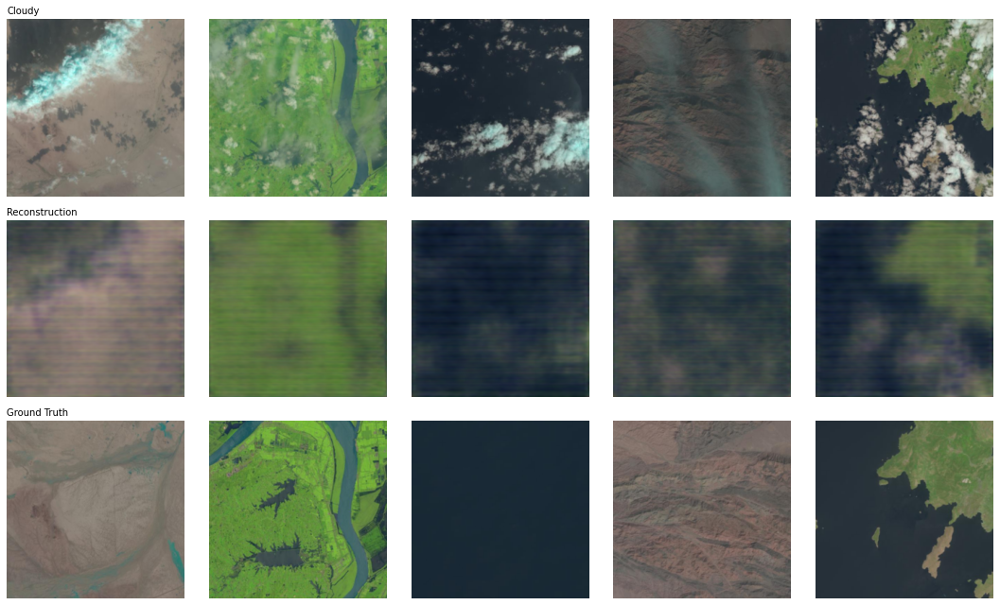

Epoch [102/150], Train: 0.5520, Val: 0.5154, LR: 6.40e-05, PSNR: 21.52 | SSIM: 0.7238
Epoch [103/150], Train: 0.5408, Val: 0.5384, LR: 6.27e-05, PSNR: 20.91 | SSIM: 0.7359
Epoch [104/150], Train: 0.5797, Val: 0.5438, LR: 6.13e-05, PSNR: 21.48 | SSIM: 0.7636
Epoch [105/150], Train: 0.5458, Val: 0.5565, LR: 6.00e-05, PSNR: 20.72 | SSIM: 0.7428
Epoch [106/150], Train: 0.5562, Val: 0.5268, LR: 5.87e-05, PSNR: 21.78 | SSIM: 0.7540
Epoch [107/150], Train: 0.5169, Val: 0.5096, LR: 5.73e-05, PSNR: 21.52 | SSIM: 0.7429
Epoch [108/150], Train: 0.5370, Val: 0.5417, LR: 5.60e-05, PSNR: 21.13 | SSIM: 0.7458
Epoch [109/150], Train: 0.5227, Val: 0.5419, LR: 5.47e-05, PSNR: 21.24 | SSIM: 0.7481
Epoch [110/150], Train: 0.5300, Val: 0.5209, LR: 5.33e-05, PSNR: 20.91 | SSIM: 0.7429
Epoch [111/150], Train: 0.5369, Val: 0.6102, LR: 5.20e-05, PSNR: 21.48 | SSIM: 0.7449


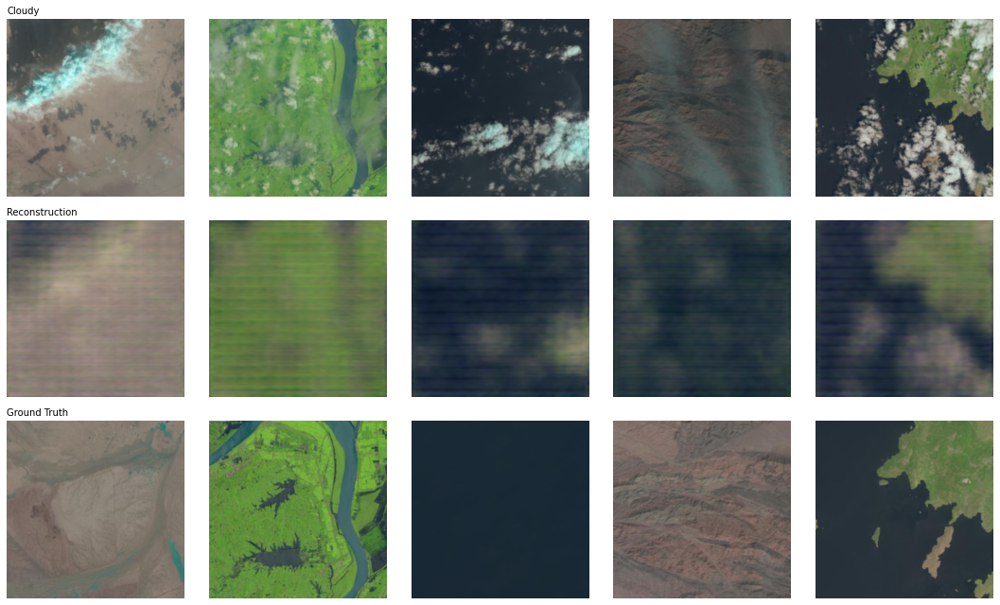

Epoch [112/150], Train: 0.5294, Val: 0.5792, LR: 5.07e-05, PSNR: 20.95 | SSIM: 0.7396
Epoch [113/150], Train: 0.5193, Val: 0.5561, LR: 4.93e-05, PSNR: 21.71 | SSIM: 0.7525
Epoch [114/150], Train: 0.5605, Val: 0.5357, LR: 4.80e-05, PSNR: 21.25 | SSIM: 0.7359
Epoch [115/150], Train: 0.5198, Val: 0.5307, LR: 4.67e-05, PSNR: 21.15 | SSIM: 0.7437
Epoch [116/150], Train: 0.5409, Val: 0.5021, LR: 4.53e-05, PSNR: 21.79 | SSIM: 0.7417
Epoch [117/150], Train: 0.5104, Val: 0.5790, LR: 4.40e-05, PSNR: 21.36 | SSIM: 0.7432
Epoch [118/150], Train: 0.5334, Val: 0.5127, LR: 4.27e-05, PSNR: 20.87 | SSIM: 0.7374
Epoch [119/150], Train: 0.5246, Val: 0.6357, LR: 4.13e-05, PSNR: 21.62 | SSIM: 0.7471
Epoch [120/150], Train: 0.5239, Val: 0.5145, LR: 4.00e-05, PSNR: 21.32 | SSIM: 0.7384
Epoch [121/150], Train: 0.5206, Val: 0.5159, LR: 3.87e-05, PSNR: 21.11 | SSIM: 0.7414


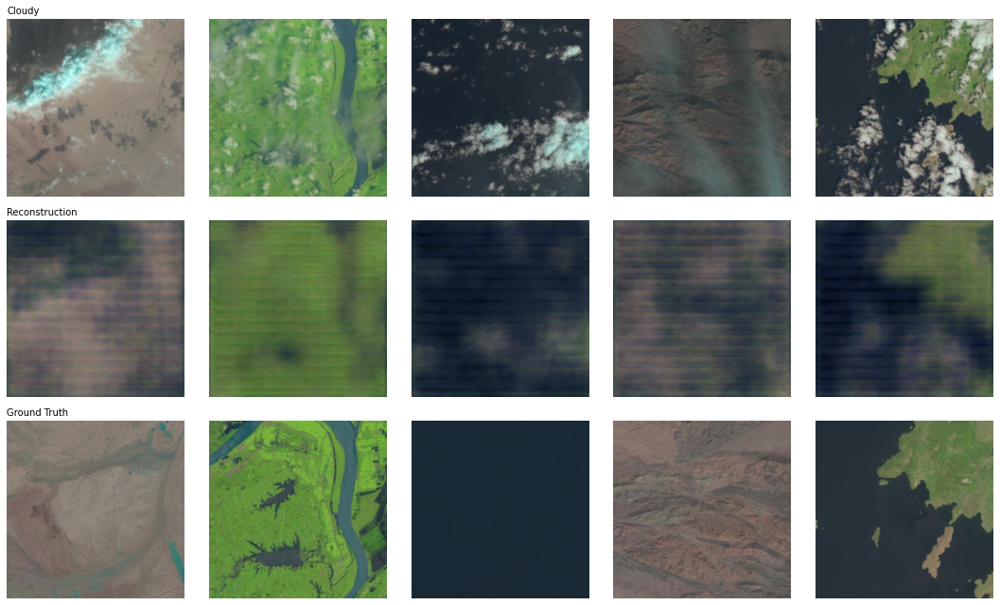

Epoch [122/150], Train: 0.5220, Val: 0.5073, LR: 3.73e-05, PSNR: 21.16 | SSIM: 0.7378
Epoch [123/150], Train: 0.5062, Val: 0.5123, LR: 3.60e-05, PSNR: 21.42 | SSIM: 0.7437
Epoch [124/150], Train: 0.5081, Val: 0.5023, LR: 3.47e-05, PSNR: 21.39 | SSIM: 0.7365
Epoch [125/150], Train: 0.5229, Val: 0.5138, LR: 3.33e-05, PSNR: 21.55 | SSIM: 0.7380
Epoch [126/150], Train: 0.5221, Val: 0.4846, LR: 3.20e-05, PSNR: 21.44 | SSIM: 0.7353
Epoch [127/150], Train: 0.5019, Val: 0.5360, LR: 3.07e-05, PSNR: 21.10 | SSIM: 0.7248
Epoch [128/150], Train: 0.4901, Val: 0.5104, LR: 2.93e-05, PSNR: 20.60 | SSIM: 0.7173
Epoch [129/150], Train: 0.5251, Val: 0.5054, LR: 2.80e-05, PSNR: 20.71 | SSIM: 0.7218
Epoch [130/150], Train: 0.5009, Val: 0.5307, LR: 2.67e-05, PSNR: 21.22 | SSIM: 0.7348
Epoch [131/150], Train: 0.4919, Val: 0.4944, LR: 2.53e-05, PSNR: 21.13 | SSIM: 0.7226


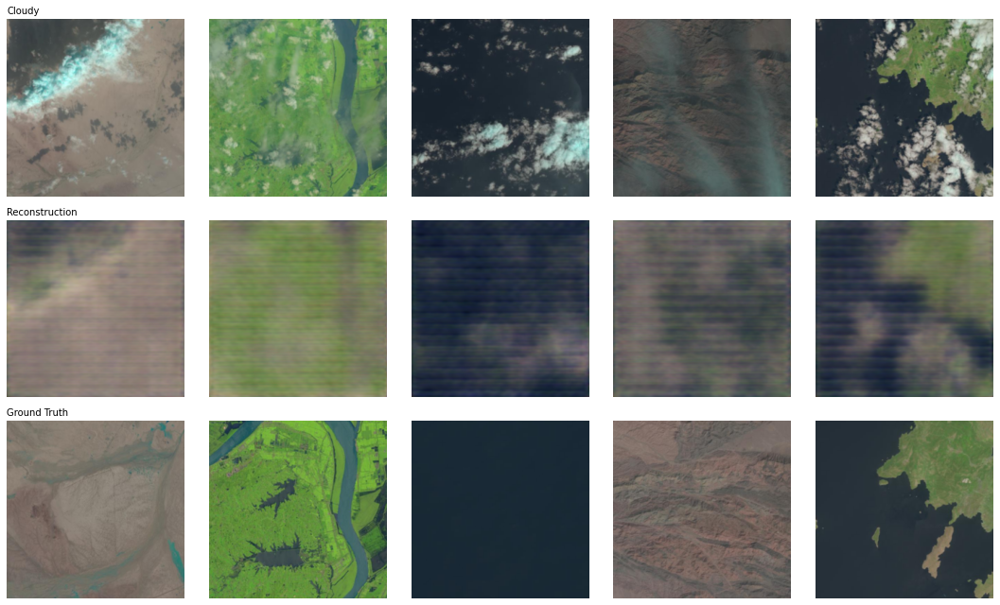

Epoch [132/150], Train: 0.4893, Val: 0.4895, LR: 2.40e-05, PSNR: 21.41 | SSIM: 0.7226
Epoch [133/150], Train: 0.4852, Val: 0.5199, LR: 2.27e-05, PSNR: 20.68 | SSIM: 0.7160
Epoch [134/150], Train: 0.4824, Val: 0.4756, LR: 2.13e-05, PSNR: 20.85 | SSIM: 0.7270
Epoch [135/150], Train: 0.4742, Val: 0.4780, LR: 2.00e-05, PSNR: 20.85 | SSIM: 0.7218
Epoch [136/150], Train: 0.4836, Val: 0.4857, LR: 1.87e-05, PSNR: 20.52 | SSIM: 0.7198
Epoch [137/150], Train: 0.4725, Val: 0.4928, LR: 1.73e-05, PSNR: 20.83 | SSIM: 0.7270
Epoch [138/150], Train: 0.4625, Val: 0.4804, LR: 1.60e-05, PSNR: 20.78 | SSIM: 0.7155
Epoch [139/150], Train: 0.4732, Val: 0.4853, LR: 1.47e-05, PSNR: 21.06 | SSIM: 0.7212
Epoch [140/150], Train: 0.4621, Val: 0.4966, LR: 1.33e-05, PSNR: 21.08 | SSIM: 0.7236
Epoch [141/150], Train: 0.4715, Val: 0.4821, LR: 1.20e-05, PSNR: 20.58 | SSIM: 0.7039


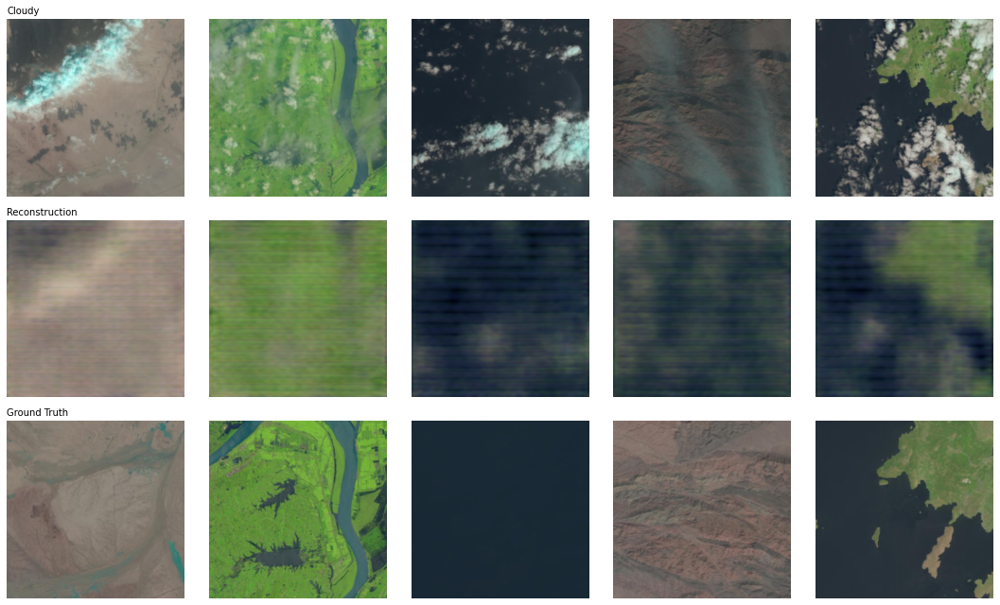

Epoch [142/150], Train: 0.4509, Val: 0.4690, LR: 1.07e-05, PSNR: 21.10 | SSIM: 0.7227
Epoch [143/150], Train: 0.4594, Val: 0.4766, LR: 9.33e-06, PSNR: 20.72 | SSIM: 0.7112
Epoch [144/150], Train: 0.4572, Val: 0.4824, LR: 8.00e-06, PSNR: 20.47 | SSIM: 0.7065
Epoch [145/150], Train: 0.4512, Val: 0.4671, LR: 6.67e-06, PSNR: 20.40 | SSIM: 0.7146
Epoch [146/150], Train: 0.4640, Val: 0.4661, LR: 5.33e-06, PSNR: 20.55 | SSIM: 0.7098
Epoch [147/150], Train: 0.4534, Val: 0.4928, LR: 4.00e-06, PSNR: 20.05 | SSIM: 0.6886
Epoch [148/150], Train: 0.4452, Val: 0.4635, LR: 2.67e-06, PSNR: 20.93 | SSIM: 0.7198


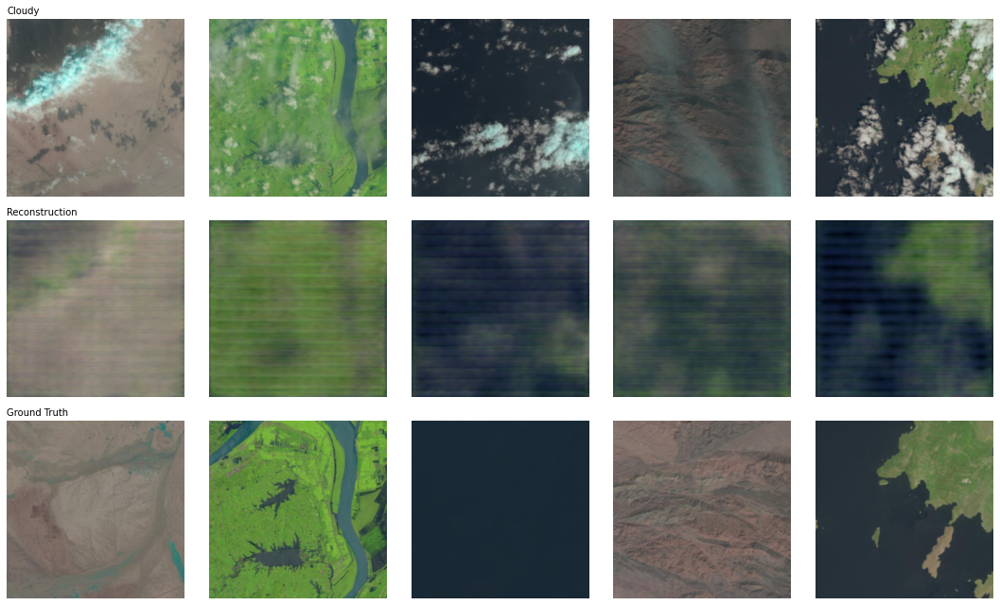

Epoch [149/150], Train: 0.4477, Val: 0.4833, LR: 1.33e-06, PSNR: 20.33 | SSIM: 0.6996


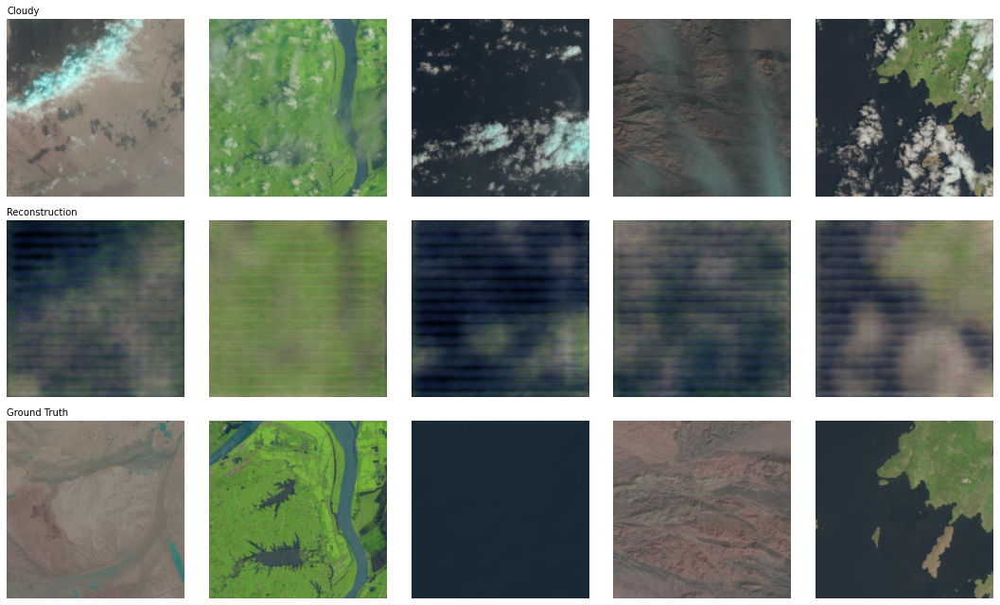

Epoch [150/150], Train: 0.4475, Val: 0.4716, LR: 0.00e+00, PSNR: 20.75 | SSIM: 0.7066


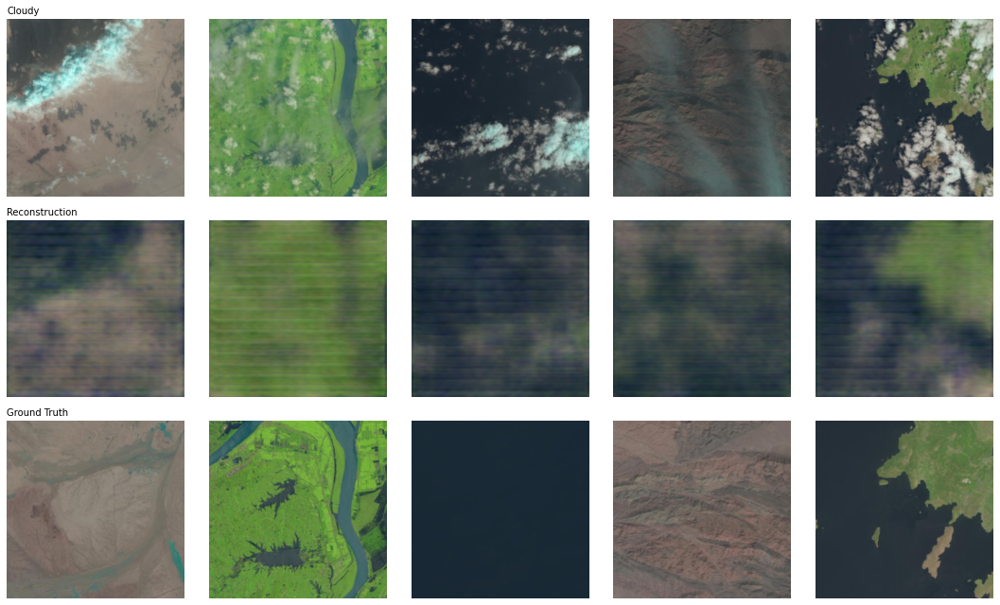

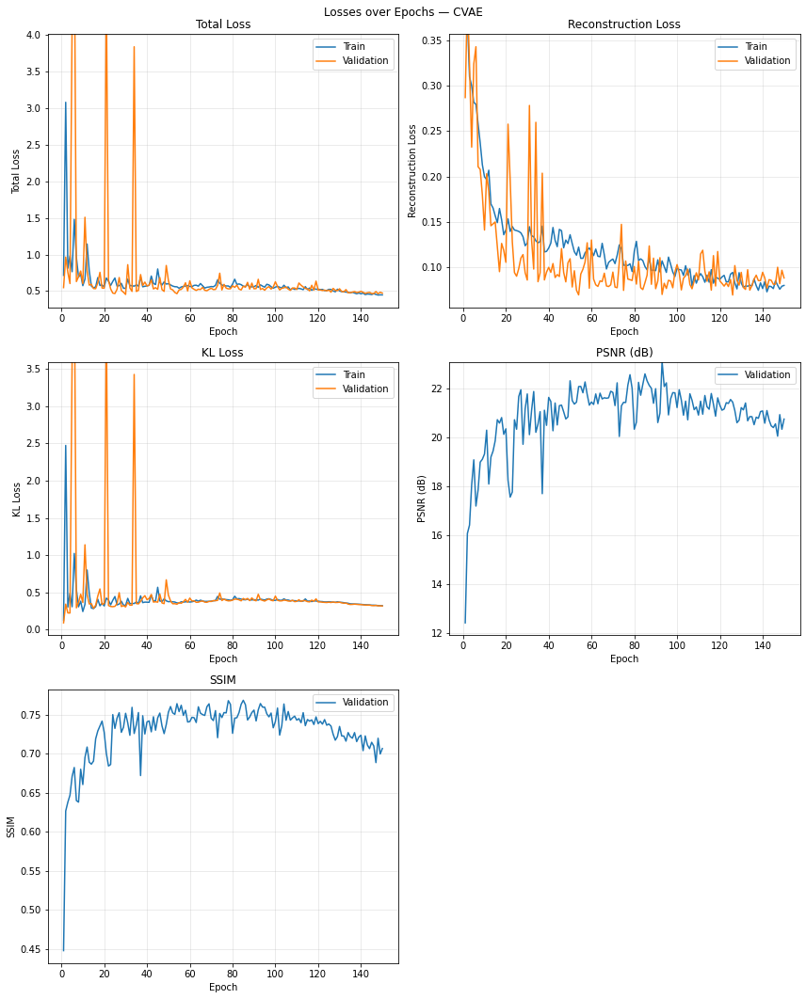

best model saved with SSIM: 0.7683342529667748 and PSNR: 20.75 at epoch 85
The training took 562.49 seconds with 3.75 seconds per epoch


In [ ]:
os.makedirs("checkpoints/CVAE", exist_ok=True) 


save_last_n_samples = 0 
plot_every = 10
start_time = time.time()

for epoch in range(num_epochs):
    model.train()
    total_loss = total_recon = total_kl = 0

    for cloudy, ground_truth, mask in train_dataloader:
        cloudy, ground_truth, mask = cloudy.to(device), ground_truth.to(device), mask.to(device)
        cond = make_cond(cloudy, mask)

        optimizer.zero_grad()
        recon, mu, logvar = model(cond, ground_truth)

        # use vae function with L1 + beta * KL divergence
        loss, recon_loss, kl_loss = vae_loss(recon, ground_truth, mu, logvar, beta)

        # add weighted L1 loss if use_masks is True
        if use_masks:
            loss = loss + w_factor * weighted_l1_loss(recon, ground_truth, mask, extra=w_extra)

        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()

    train_losses.append(total_loss / len(train_dataloader))
    train_recon.append(total_recon / len(train_dataloader))
    train_kl.append(total_kl / len(train_dataloader))

    model.eval()
    total_loss = total_recon = total_kl = 0
    psnr_total = ssim_total = 0.0
    
    # count the number of images processed for PSNR and SSIM averaging
    n_images = 0

    with torch.no_grad():
        for cloudy, ground_truth, mask in val_dataloader:
            cloudy, ground_truth, mask = cloudy.to(device), ground_truth.to(device), mask.to(device)
            cond = make_cond(cloudy, mask)

            recon, mu, logvar = model(cond, ground_truth)
            loss, recon_loss, kl_loss = vae_loss(recon, ground_truth, mu, logvar, beta)
            if use_masks:
                loss = loss + w_factor * weighted_l1_loss(
                    recon, ground_truth, mask, extra=w_extra
                )
            total_loss += loss.item()
            total_recon += recon_loss.item()
            total_kl += kl_loss.item()

            # generate function for generating from the conditional input, without using the ground_truth (ground truth)
            gen = model.generate(cond)
            # compute PSNR and SSIM for each image in the batch
            for i in range(gen.size(0)):
                out_np, gt_np = to_img(gen[i]), to_img(ground_truth[i])
                psnr_total += psnr_fn(gt_np, out_np, data_range=1.0)
                ssim_total += compute_ssim(gt_np, out_np)
                n_images += 1

    val_losses.append(total_loss / len(val_dataloader))
    val_recon.append(total_recon / len(val_dataloader))
    val_kl.append(total_kl / len(val_dataloader))
    val_psnrs.append(psnr_total / n_images)
    val_ssims.append(ssim_total / n_images)
    score = val_ssims[-1]   

    if scheduler is not None:
        scheduler.step()

    # Early stopping: save the model if the current score is better than the best score
    if score > best_score:  
        torch.save(
            {"epoch": epoch, "generator": model.state_dict()},
            "checkpoints/CVAE/best.pt",
        )
        best_score = score

    current_lr = optimizer.param_groups[0]["lr"]
    print(
        f"Epoch [{epoch+1}/{num_epochs}], Train: {train_losses[-1]:.4f}, "
        f"Val: {val_losses[-1]:.4f}, LR: {current_lr:.2e}, "  # Komma+Space ergänzt
        f"PSNR: {val_psnrs[-1]:.2f} | SSIM: {val_ssims[-1]:.4f}"
    )

    # only save save_last_n_samples. plot every plot_every epochs and the last save_last_n_samples epochs
    save_path = None
    if epoch >= num_epochs - save_last_n_samples:
        save_path = f"checkpoints/CVAE/samples_epoch{epoch + 1}.png"
    if epoch % plot_every == 0 or epoch >= num_epochs - save_last_n_samples:
        plot_samples_cvae(
            model, fixed_batch, device, use_masks=use_masks, n=5, save_path=save_path
        )
plot_losses(
    {
        "Total Loss": (train_losses, val_losses),
        "Reconstruction Loss": (train_recon, val_recon),
        "KL Loss": (train_kl, val_kl),
        "PSNR (dB)": (None, val_psnrs),
        "SSIM": (None, val_ssims),
    },
    model_name="CVAE",
    ncols=2,
    save_path="checkpoints/CVAE/metrics.png",
)

print(f"best model saved with SSIM: {best_score} and PSNR: {val_psnrs[-1]:.2f} at epoch {val_ssims.index(best_score) + 1}")

duration = time.time() - start_time
print(
    f"The training took {duration:.2f} seconds "
    f"with {duration / num_epochs:.2f} seconds per epoch"
)

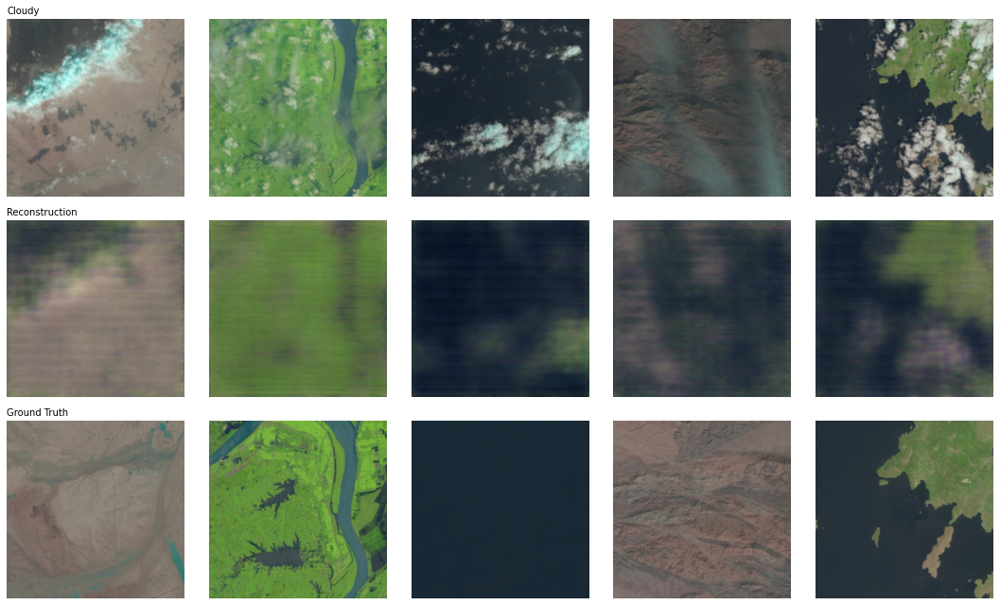

In [7]:
#best model on fixed batch
ckpt = torch.load("checkpoints/CVAE/best.pt", map_location=device)
model.load_state_dict(ckpt["generator"])
model.eval()
plot_samples_cvae(
            model, fixed_batch, device, use_masks=use_masks, n=5, save_path=None
        )

In [ ]:
# evaluate the best model on the test set

ckpt = torch.load("checkpoints/CVAE/best.pt", map_location=device)
model.load_state_dict(ckpt["generator"])
model.eval()
print(f"Bestes Modell aus Epoch {ckpt['epoch'] + 1} geladen.")

# metrics on the whole test set
psnr_total, ssim_total, n = 0.0, 0.0, 0
with torch.no_grad():
    for cloudy, target, mask in test_dataloader:
        cloudy, target, mask = cloudy.to(device), target.to(device), mask.to(device)
              # cloudy(+mask)
        cond = make_cond(cloudy, mask)
        output_gen = model.generate(cond)       # z - N(0,1) 

        for i in range(output_gen.size(0)):
            out_np, gt_np = to_img(output_gen[i]), to_img(target[i])
            psnr_total += psnr_fn(gt_np, out_np, data_range=1.0)
            ssim_total += compute_ssim(gt_np, out_np)
            n += 1

test_psnr = psnr_total / n
test_ssim = ssim_total / n
print(f"TEST  PSNR: {test_psnr:.2f} dB | SSIM: {test_ssim:.4f}  (über {n} Bilder)")

Bestes Modell aus Epoch 85 geladen.
TEST  PSNR: 23.35 dB | SSIM: 0.7610  (über 148 Bilder)
